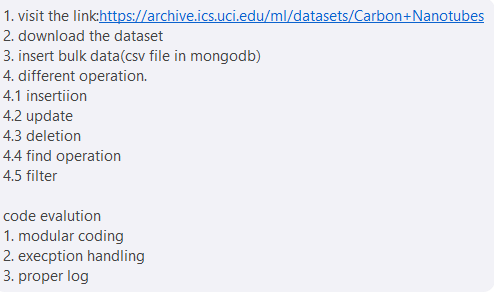

# Importing modules

In [1]:
from utilities import csv_file_utility as csv_util
from services import csv_file_service as csv_fs
from utilities import mongo_db_utility as mongo_util

# 1- Read CSV File and bind its data into dictionary

In [2]:
try:
    csv_file = "storage/data_sets/carbon_nanotubes.csv";
    csvFile = csv_util.CsvFileUtility(csv_file)
    dict_data = csv_fs.CsvFileService.get_dictionary_data_from_csv(csvFile)
except Exception as ex:
    print(ex)

# 1.1- Checking CSV Dictionary value

In [3]:
print(dict_data)

[{'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,679005', 'Initial atomic coordinate v': '0,701318', 'Initial atomic coordinate w': '0,017033', "Calculated atomic coordinates u'": '0,721039', "Calculated atomic coordinates v'": '0,730232', "Calculated atomic coordinates w'": '0,017014'}, {'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,717298', 'Initial atomic coordinate v': '0,642129', 'Initial atomic coordinate w': '0,231319', "Calculated atomic coordinates u'": '0,738414', "Calculated atomic coordinates v'": '0,65675', "Calculated atomic coordinates w'": '0,232369'}, {'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,489336', 'Initial atomic coordinate v': '0,303751', 'Initial atomic coordinate w': '0,088462', "Calculated atomic coordinates u'": '0,477676', "Calculated atomic coordinates v'": '0,263221', "Calculated atomic coordinates w'": '0,088712'}, {'Chiral indice n': '2', 'Chira

# 2-MongoDB Bulk Data insert

In [2]:
COLLECTION_NAME = "atmoic_coordinates"

In [5]:
try:
    mongo_util.MongoDbUtility.insert_entry(COLLECTION_NAME, dict_data)
except Exception as ex:
    print(ex)

## 2.1 Checking inserted values

In [3]:
try:
    result = mongo_util.MongoDbUtility.get_all_entries(COLLECTION_NAME)
    print(result)
except Exception as ex:
    print(ex)

[{'_id': ObjectId('6218781060a602cf34529dbd'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,679005', 'Initial atomic coordinate v': '0,701318', 'Initial atomic coordinate w': '0,017033', "Calculated atomic coordinates u'": '0,721039', "Calculated atomic coordinates v'": '0,730232', "Calculated atomic coordinates w'": '0,017014'}, {'_id': ObjectId('6218781060a602cf34529dbe'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,717298', 'Initial atomic coordinate v': '0,642129', 'Initial atomic coordinate w': '0,231319', "Calculated atomic coordinates u'": '0,738414', "Calculated atomic coordinates v'": '0,65675', "Calculated atomic coordinates w'": '0,232369'}, {'_id': ObjectId('6218781060a602cf34529dbf'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,489336', 'Initial atomic coordinate v': '0,303751', 'Initial atomic coordinate w': '0,088462', "Calculated atomic coordinates u'": '0,47

# 3. Update a document

In [6]:
from bson.objectid import ObjectId

## 3.1 Before update checking value

In [7]:
try:
    condition = {
        '_id': ObjectId('6218781060a602cf34529dbd')
    }
    result = mongo_util.MongoDbUtility.get_entries_by_condition(COLLECTION_NAME, condition)
    print(result)
except Exception as ex:
    print(ex)

[{'_id': ObjectId('6218781060a602cf34529dbd'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,679005', 'Initial atomic coordinate v': '0,701318', 'Initial atomic coordinate w': '0,017033', "Calculated atomic coordinates u'": '0,721039', "Calculated atomic coordinates v'": '0,730232', "Calculated atomic coordinates w'": '0,017014'}]


## 3.2 Updating a value

In [10]:
try:
    condition = {
        '_id': ObjectId('6218781060a602cf34529dbd')
    }
    update_value = {"$set":{
            'Chiral indice n': 3
        }
    }
    result = mongo_util.MongoDbUtility.update_entry(COLLECTION_NAME, condition, update_value)
except Exception as ex:
    print(ex)

## 3.3 After the updating the document checking its values

In [13]:
try:
    condition = {
        '_id': ObjectId('6218781060a602cf34529dbd')
    }
    result = mongo_util.MongoDbUtility.get_entries_by_condition(COLLECTION_NAME, condition)
    print(result)
except Exception as ex:
    print(ex)

[{'_id': ObjectId('6218781060a602cf34529dbd'), 'Chiral indice n': 3, 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,679005', 'Initial atomic coordinate v': '0,701318', 'Initial atomic coordinate w': '0,017033', "Calculated atomic coordinates u'": '0,721039', "Calculated atomic coordinates v'": '0,730232', "Calculated atomic coordinates w'": '0,017014'}]


# 4. Delete an entry

## 4.1 Before deleting by id checking the document existence

In [14]:
try:
    condition = {
        '_id': ObjectId('6218781060a602cf34529dbd')
    }
    result = mongo_util.MongoDbUtility.get_entries_by_condition(COLLECTION_NAME, condition)
    print(result)
except Exception as ex:
    print(ex)

[{'_id': ObjectId('6218781060a602cf34529dbd'), 'Chiral indice n': 3, 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,679005', 'Initial atomic coordinate v': '0,701318', 'Initial atomic coordinate w': '0,017033', "Calculated atomic coordinates u'": '0,721039', "Calculated atomic coordinates v'": '0,730232', "Calculated atomic coordinates w'": '0,017014'}]


## 4.2 Deleting a document by id

In [16]:
try:
    condition = {
        '_id': ObjectId('6218781060a602cf34529dbd')
    }
    update_value = {"$set":{
            'Chiral indice n': 3
        }
    }
    result = mongo_util.MongoDbUtility.delete_entry(COLLECTION_NAME, condition)
except Exception as ex:
    print(ex)

## 4.3 After the deletion of the document checking its existence

In [17]:
try:
    condition = {
        '_id': ObjectId('6218781060a602cf34529dbd')
    }
    result = mongo_util.MongoDbUtility.get_entries_by_condition(COLLECTION_NAME, condition)
    print(result)
except Exception as ex:
    print(ex)

[]


# 5. Find operation

In [18]:
try:
    result = mongo_util.MongoDbUtility.get_all_entries(COLLECTION_NAME)
    print(result)
except Exception as ex:
    print(ex)

[{'_id': ObjectId('6218781060a602cf34529dbe'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,717298', 'Initial atomic coordinate v': '0,642129', 'Initial atomic coordinate w': '0,231319', "Calculated atomic coordinates u'": '0,738414', "Calculated atomic coordinates v'": '0,65675', "Calculated atomic coordinates w'": '0,232369'}, {'_id': ObjectId('6218781060a602cf34529dbf'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,489336', 'Initial atomic coordinate v': '0,303751', 'Initial atomic coordinate w': '0,088462', "Calculated atomic coordinates u'": '0,477676', "Calculated atomic coordinates v'": '0,263221', "Calculated atomic coordinates w'": '0,088712'}, {'_id': ObjectId('6218781060a602cf34529dc0'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,413957', 'Initial atomic coordinate v': '0,632996', 'Initial atomic coordinate w': '0,040843', "Calculated atomic coordinates u'": '0,40

# 6. Filter operation

In [19]:
try:
    condition = {
        'Initial atomic coordinate u': {"$in":["0,717298", "0,679005"]},
    }
    result = mongo_util.MongoDbUtility.get_entries_by_condition(COLLECTION_NAME, condition)
    print(result)
except Exception as ex:
    print(ex)

[{'_id': ObjectId('6218781060a602cf34529dbe'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,717298', 'Initial atomic coordinate v': '0,642129', 'Initial atomic coordinate w': '0,231319', "Calculated atomic coordinates u'": '0,738414', "Calculated atomic coordinates v'": '0,65675', "Calculated atomic coordinates w'": '0,232369'}, {'_id': ObjectId('6218781060a602cf34529dcb'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,679005', 'Initial atomic coordinate v': '0,701318', 'Initial atomic coordinate w': '0,6837', "Calculated atomic coordinates u'": '0,718811', "Calculated atomic coordinates v'": '0,738577', "Calculated atomic coordinates w'": '0,68244'}, {'_id': ObjectId('6218781060a602cf34529dd5'), 'Chiral indice n': '2', 'Chiral indice m': '1', 'Initial atomic coordinate u': '0,717298', 'Initial atomic coordinate v': '0,642129', 'Initial atomic coordinate w': '0,897985', "Calculated atomic coordinates u'": '0,77052